In [1]:
import os
os.chdir('..')
import h5py
import config
import numpy as np
from utils.imgShow import imgShow
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from utils.geotif_io import readTiff
from utils.transform_xy import coor2coor
from utils.interps import interp3d


In [2]:
path_img = config.root + '/data/rs_img/pine_island_S3A_20180207T115228_20180207T115528.tif'
s3_img, s3_img_info = readTiff(path_img)
print(s3_img_info)


{'geoextent': (-1741002.5304, -1437153.6139, -380178.3167, -165679.325), 'geotrans': (-1741002.5304, 295.8606781888998, 0.0, -165679.325, 0.0, -295.8606782068966), 'geosrs': '3031', 'row': 725, 'col': 1027, 'bands': 3}


In [3]:
with h5py.File('data/icesat2/land_ice_antarctic/preprocessed/pineisland_atl06_AD_subs.h5','r') as f_c:
    print(f_c.keys())
    lon_ad = f_c['lon'][:]
    lat_ad = f_c['lat'][:]
    t_ad = f_c['t_year'][:]
    z_ad = f_c['h_elv'][:]

x_ad, y_ad = coor2coor('4326', '3031', lon_ad, lat_ad)


<KeysViewHDF5 ['beam_type', 'cycle', 'h_elv', 'lat', 'lon', 'quality_summary', 'rgt', 'spot', 't_year']>


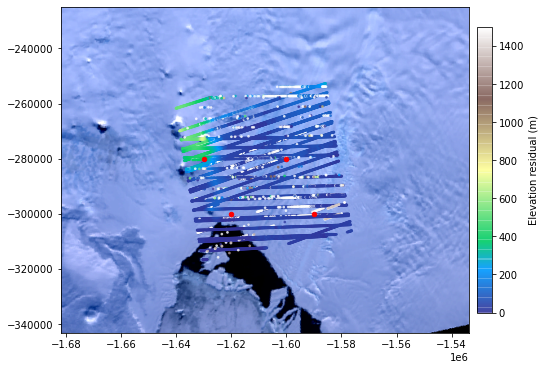

In [4]:
points_x = [-1630000, -1620000, -1600000, -1590000]
points_y = [-280000, -300000, -280000, -300000]
points_t = [2019.3, 2019.5, 2019.6, 2019.7]

fig = plt.figure(figsize=(8,6))
# imgShow(s3_img, extent=s3_img_info['geoextent'], color_bands=(0, 1, 2), clip_percent=5)
imgShow(s3_img, extent=s3_img_info['geoextent'], color_bands=(0, 1, 2), \
                                            clip_percent=2, focus=[200,600, 200,700])
plt.scatter(x_ad[::10], y_ad[::10], s=3, c=z_ad[::10], \
                                            alpha=0.7, cmap='terrain')
plt.clim([0,1500])
plt.colorbar(fraction=0.0320, pad=0.02, label='Elevation residual (m)')
plt.scatter(points_x, points_y, s=20, c="r")


### 3-D interpolation: result in a 3-d interpolation map (map.shape->[row, col, band]). 

In [5]:
# !python utils_main/points2cube.py -h


In [6]:
# !python utils_main/points2cube.py data/icesat2/land_ice_antarctic/preprocessed/pineisland_atl06_AD.h5 data/icesat2/land_ice_antarctic/preprocessed/pineisland_data_cube.h5 -d 2 2 2 \
# -r 3 -a 10 0.25 -p 3031 -c 10 3 1500 -v lon lat h_elv t_year -s 1



parameters:
('ifile', ['data/icesat2/land_ice_antarctic/preprocessed/pineisland_atl06_AD.h5'])
('ofile', ['data/icesat2/land_ice_antarctic/preprocessed/pineisland_data_cube.h5'])
('dxyt', [2.0, 2.0, 2.0])
('radius', [3.0])
('alpha', [10.0, 0.25])
('proj', ['3031'])
('n_sample', [1])
('filter', [10.0, 3.0, 1500.0])
('vnames', ['lon', 'lat', 'h_elv', 't_year'])
-> reading data ...
-> filtering data ...
-> creating kdtree ...
-> interpolating data ...
-> saving predictions to file...


In [86]:

def interp3d(x, y, t, z, \
                xi, yi, ti, alpha_d, alpha_t):
    '''
    des: 3-d interpolation by using gaussian method
    '''
    d_time = np.abs(t - ti)    # time difference from all the points.            
    d_spat = np.sqrt((x - xi)**2 + (y - yi)**2)  # distance from interpolated point.
    # --- Compute the weighting factors, larger dist,dt, smaller ed,et
    # !!!alpha_d, alpha_t are actually the sigma in gaussian distribution function
    ed = np.exp(-(d_spat ** 2)/(2 * alpha_d ** 2))
    et = np.exp(-(d_time ** 2)/(2 * alpha_t ** 2))
    # Combine weights and scale with error, similar to the joint probability density function
    w = ed * et            
    w += 1e-6    # avoid division of zero
    zi = np.nansum(w*z)/np.nansum(w)   #  weighted mean height
    sigma_r = np.nansum(w*(z-zi)**2)/np.nansum(w)  # Compute weighted height std 
    ei = np.sqrt(sigma_r ** 2)   # prediction error at grid node (interpolated point)
    ni = len(z)                  # Number of obs. in solution
    
    return zi, ei, ni


In [97]:
from scipy.spatial import cKDTree
Zi, Ei, Ni = np.ones((len(points_x)))*np.nan, np.ones((len(points_x)))*np.nan, np.ones((len(points_x)))*np.nan
idx_valid = np.where((z_ad > 0) & (z_ad<2000))
x_ad, y_ad, z_ad, t_ad = x_ad[idx_valid], y_ad[idx_valid], z_ad[idx_valid], t_ad[idx_valid]

tree = cKDTree(np.c_[x_ad, y_ad])
for i in range(len(points_x)):
    idx = tree.query_ball_point([points_x[i], points_y[i]], r=3000)
    # print(len(idx))
    if len(idx) == 0: 
        continue
    x_local = x_ad[idx]
    y_local = y_ad[idx]
    z_local = z_ad[idx]
    t_local = t_ad[idx]
    zi, ei, ni = interp3d(x=x_local, y=y_local, t=t_local, z=z_local, \
                    xi=points_x[i], yi=points_y[i], ti=points_t[i], alpha_d=2000, alpha_t=0.25)

    ## Save data to output (interpolated point: (k,i,j) )
    Zi[i] = zi    # interpolated height
    Ei[i] = ei    # interpolated error
    Ni[i] = ni    # number of points in the interpolation.

print(Zi)
print(Ei)
print(Ni)


[344.46102172  29.07405168  61.55879608  25.08132777]
[5686.87222082   10.8650626  3714.72390538   44.99383758]
[4328.  529. 2440. 2070.]


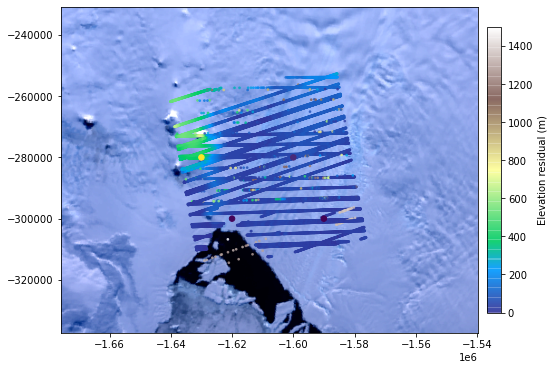

In [98]:

fig = plt.figure(figsize=(8,6))
imgShow(s3_img, extent=s3_img_info['geoextent'], color_bands=(0, 1, 2), \
                                            clip_percent=2, focus=[220, 580, 220, 680])
plt.scatter(x_ad[::5], y_ad[::5], s=3, c=z_ad[::5], \
                                            alpha=0.7, cmap='terrain')
plt.clim([0,1500])
plt.colorbar(fraction=0.0320, pad=0.02, label='Elevation residual (m)')
plt.scatter(points_x, points_y, s=30, c=Zi)




In [29]:
with h5py.File('data/icesat2/land_ice_antarctic/preprocessed/pineisland_data_cube.h5','r') as f_c:
    print(f_c.keys())
    xi_cube = f_c['X'][:]
    yi_cube = f_c['Y'][:]
    ti_cube = f_c['time'][:]
    zi_cube = f_c['Z_interp'][:]
    print(zi_cube.shape)
    zirmse_cube = f_c['Z_rmse'][:]

lon_cube, lat_cube = coor2coor('3031', '4326', xi_cube, yi_cube)


<KeysViewHDF5 ['X', 'Y', 'Z_interp', 'Z_nobs', 'Z_rmse', 'epsg', 'time']>
(69, 91, 7)


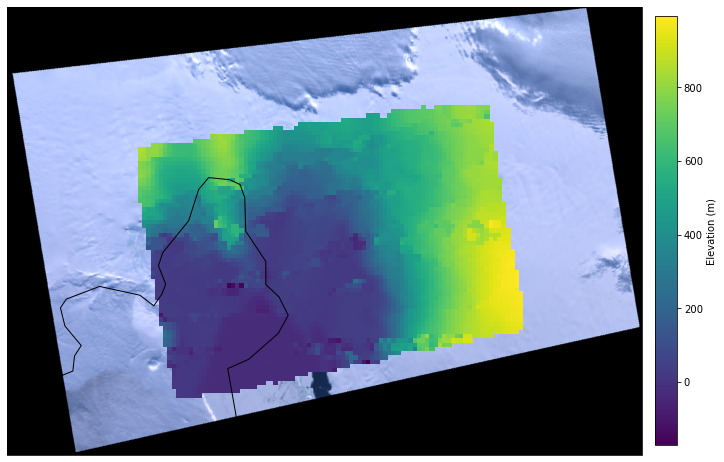

In [30]:
fig = plt.figure(figsize=(12,10))
ax = plt.axes(projection=ccrs.SouthPolarStereo())
imgShow(s3_img, extent=s3_img_info['geoextent'], color_bands=(0, 1, 2), clip_percent=5)
plt.pcolormesh(xi_cube, yi_cube, zi_cube[:,:,5], cmap='viridis')
# plt.scatter(xi_cube.ravel(), yi_cube.ravel(), s=3, c=zi_cube[:,:,3].ravel(), \
                                                        # alpha=.7, cmap='terrain')
# plt.clim([800,1000])
plt.colorbar(fraction=0.0320, pad=0.02, label='Elevation (m)')
ax.coastlines('50m')
